In [2]:
## import necessay libraries
import numpy as np
import pandas as pd

## for visualization
import matplotlib.pylab as plt
import seaborn as sns

## import VIf
from statsmodels.stats.outliers_influence import variance_inflation_factor

## import train test split
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV

## import logistic regression
from sklearn.linear_model import LogisticRegression

## import metrics
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix

## import decisiom tree
from sklearn.tree import DecisionTreeClassifier,plot_tree

## import randomforest,adaboost,gradientboost
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier,AdaBoostClassifier

## import support vector algo
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.svm import SVC,SVR

##Removes All The Warnings Present
import warnings
warnings.filterwarnings("ignore")

C:\Users\Asus\AppData\Local\Temp\ipykernel_12840\2169259462.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


## 2. Problem Statement

#### Prediction of Churn by using machine learning 

Target Column : Churn 

## 3. Data Gathering 

In [48]:
df= pd.read_csv(r"C:\Users\Asus\Desktop\Classification dataset.csv")
df

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128,25,265.1,197.4,244.7,10.0,1,no,no,yes,110,45.07,99,16.78,91,11.01,3,2.70,415
1,107,26,161.6,195.5,254.4,13.7,1,no,no,yes,123,27.47,103,16.62,103,11.45,3,3.70,415
2,137,0,243.4,121.2,162.6,12.2,0,no,no,no,114,41.38,110,10.30,104,7.32,5,3.29,415
3,84,0,299.4,61.9,196.9,6.6,2,no,yes,no,71,50.90,88,5.26,89,8.86,7,1.78,408
4,75,0,166.7,148.3,186.9,10.1,3,no,yes,no,113,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,36,156.2,215.5,279.1,9.9,2,no,no,yes,77,26.55,126,18.32,83,12.56,6,2.67,415
3329,68,0,231.1,153.4,191.3,9.6,3,no,no,no,57,39.29,55,13.04,123,8.61,4,2.59,415
3330,28,0,180.8,288.8,191.9,14.1,2,no,no,no,109,30.74,58,24.55,91,8.64,6,3.81,510
3331,184,0,213.8,159.6,139.2,5.0,2,no,yes,no,105,36.35,84,13.57,137,6.26,10,1.35,510


## 4. EDA

In [49]:
df.shape

(3333, 19)

In [50]:
## get information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 19 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Account_Length  3333 non-null   int64  
 1   Vmail_Message   3333 non-null   int64  
 2   Day_Mins        3333 non-null   float64
 3   Eve_Mins        3333 non-null   float64
 4   Night_Mins      3333 non-null   float64
 5   Intl_Mins       3333 non-null   float64
 6   CustServ_Calls  3333 non-null   int64  
 7   Churn           3333 non-null   object 
 8   Intl_Plan       3333 non-null   object 
 9   Vmail_Plan      3333 non-null   object 
 10  Day_Calls       3333 non-null   int64  
 11  Day_Charge      3333 non-null   float64
 12  Eve_Calls       3333 non-null   int64  
 13  Eve_Charge      3333 non-null   float64
 14  Night_Calls     3333 non-null   int64  
 15  Night_Charge    3333 non-null   float64
 16  Intl_Calls      3333 non-null   int64  
 17  Intl_Charge     3333 non-null   f

In [51]:
## get statstical information
df.describe()

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,8.099010,179.775098,200.980348,200.872037,10.237294,1.562856,100.435644,30.562307,100.114311,17.083540,100.107711,9.039325,4.479448,2.764581,437.182418
std,39.822106,13.688365,54.467389,50.713844,50.573847,2.791840,1.315491,20.069084,9.259435,19.922625,4.310668,19.568609,2.275873,2.461214,0.753773,42.371290
min,1.000000,0.000000,0.000000,0.000000,23.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.000000,1.040000,0.000000,0.000000,408.000000
25%,74.000000,0.000000,143.700000,166.600000,167.000000,8.500000,1.000000,87.000000,24.430000,87.000000,14.160000,87.000000,7.520000,3.000000,2.300000,408.000000
50%,101.000000,0.000000,179.400000,201.400000,201.200000,10.300000,1.000000,101.000000,30.500000,100.000000,17.120000,100.000000,9.050000,4.000000,2.780000,415.000000
75%,127.000000,20.000000,216.400000,235.300000,235.300000,12.100000,2.000000,114.000000,36.790000,114.000000,20.000000,113.000000,10.590000,6.000000,3.270000,510.000000
max,243.000000,51.000000,350.800000,363.700000,395.000000,20.000000,9.000000,165.000000,59.640000,170.000000,30.910000,175.000000,17.770000,20.000000,5.400000,510.000000


<Axes: xlabel='Account_Length', ylabel='Density'>

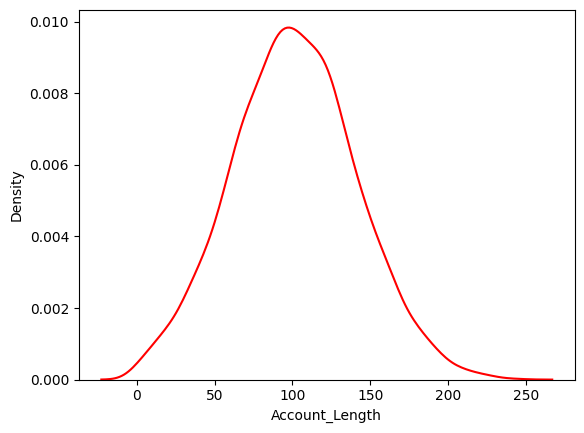

In [52]:
sns.kdeplot(df["Account_Length"],color="red")

<Axes: xlabel='Area_Code', ylabel='Density'>

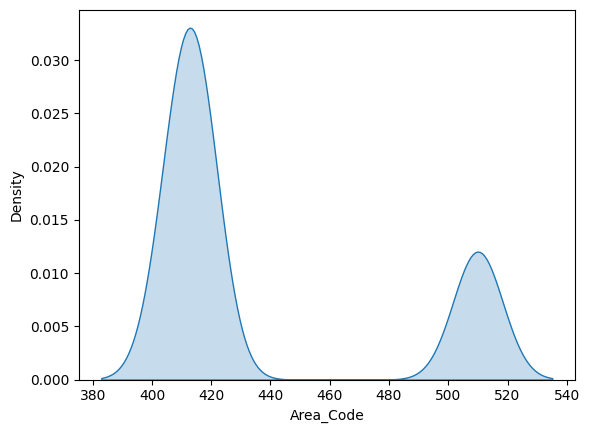

In [53]:
sns.kdeplot(df["Area_Code"],fill=True)

<Axes: xlabel='CustServ_Calls', ylabel='Count'>

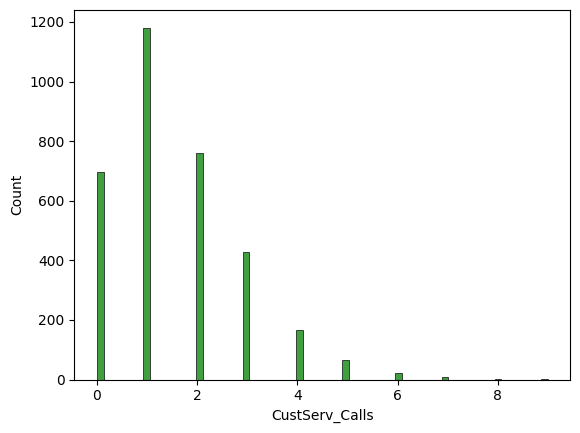

In [54]:
sns.histplot(df["CustServ_Calls"],color="Green")

<Axes: xlabel='Day_Calls', ylabel='Density'>

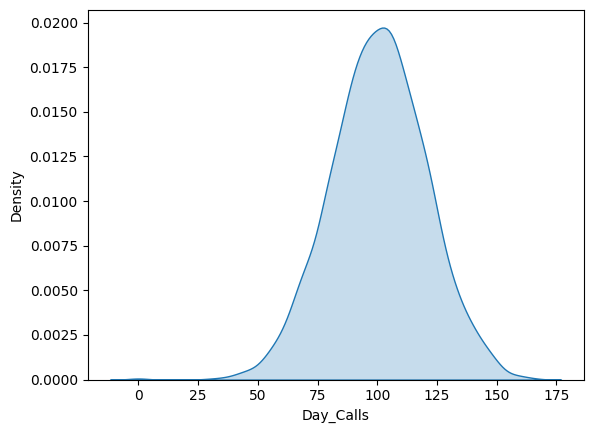

In [55]:
sns.kdeplot(df["Day_Calls"],fill= True)

<Axes: xlabel='Day_Charge', ylabel='Density'>

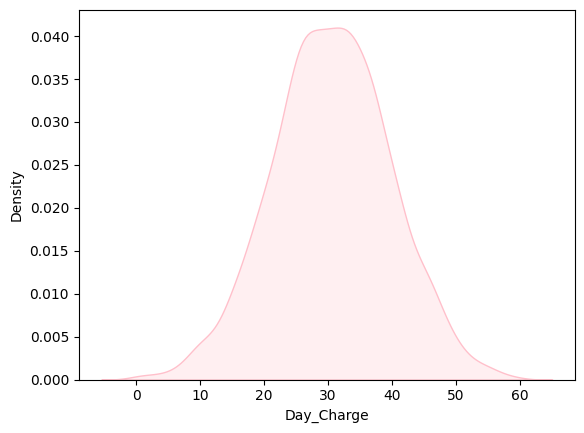

In [56]:
sns.kdeplot(df["Day_Charge"],fill=True,color="pink")

<Axes: xlabel='Day_Mins', ylabel='Count'>

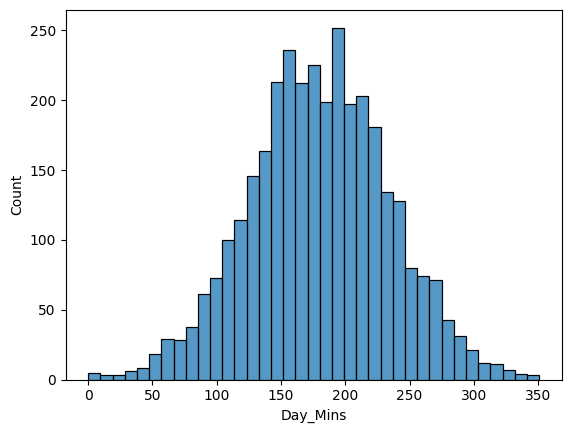

In [57]:
sns.histplot(df["Day_Mins"])

<Axes: xlabel='Eve_Calls', ylabel='Density'>

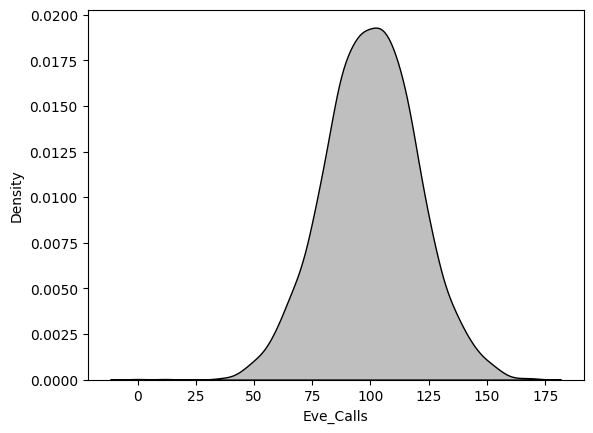

In [58]:
sns.kdeplot(df["Eve_Calls"],fill= True, color="Black")

<Axes: xlabel='Eve_Charge', ylabel='Density'>

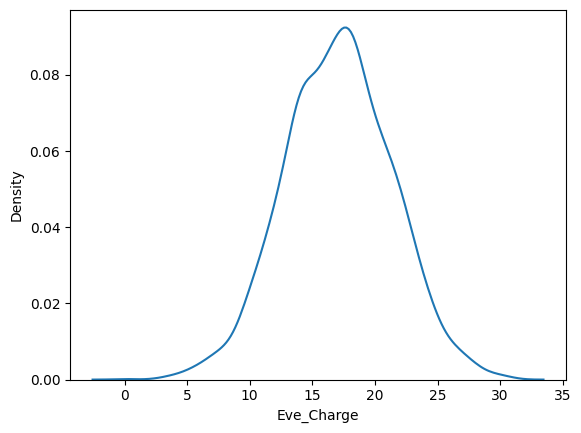

In [59]:
sns.kdeplot(df["Eve_Charge"])

<Axes: xlabel='Eve_Mins', ylabel='Count'>

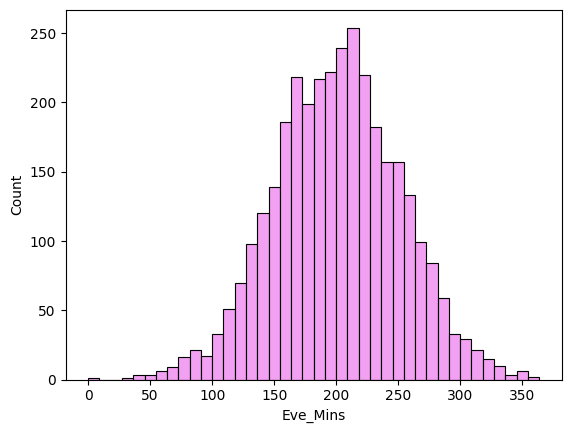

In [60]:
sns.histplot(df["Eve_Mins"],color="Violet")

<Axes: xlabel='Intl_Calls', ylabel='Density'>

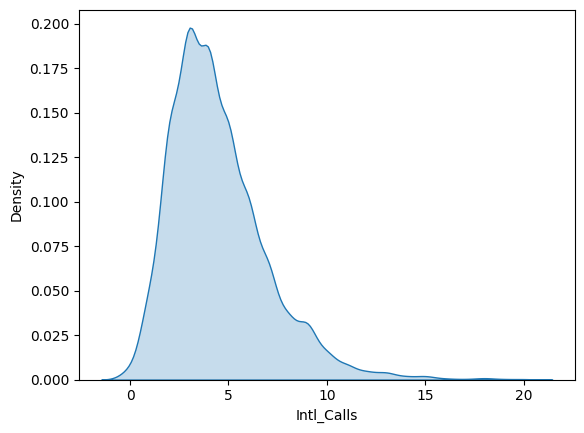

In [61]:
sns.kdeplot(df["Intl_Calls"],fill=True)

<Axes: xlabel='Intl_Charge', ylabel='Density'>

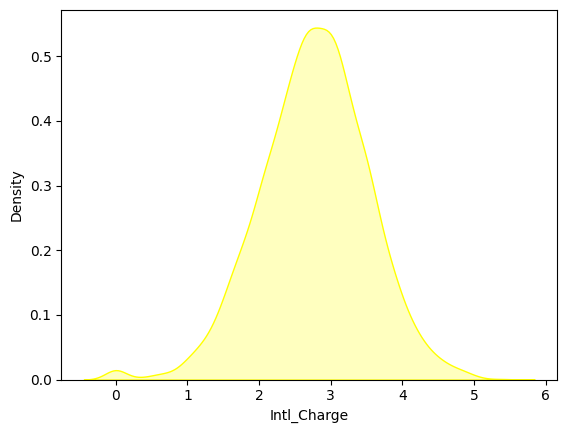

In [62]:
sns.kdeplot(df["Intl_Charge"],fill=True,color="yellow")

In [63]:
df["Churn"].value_counts()

Churn
no     2850
yes     483
Name: count, dtype: int64

<Axes: xlabel='Churn', ylabel='count'>

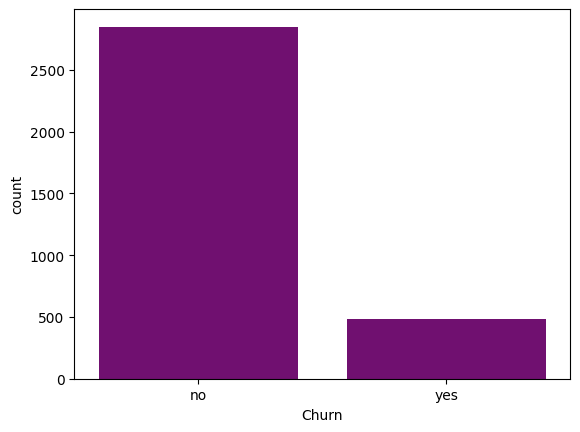

In [64]:
sns.countplot(x=df["Churn"],color= "Purple")

<Axes: xlabel='Intl_Plan', ylabel='count'>

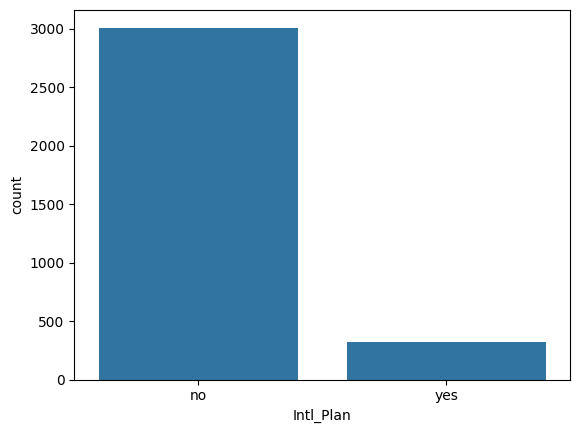

In [65]:
sns.countplot(x=df["Intl_Plan"])

In [66]:
## sns.pairplot(df,hue="Churn")

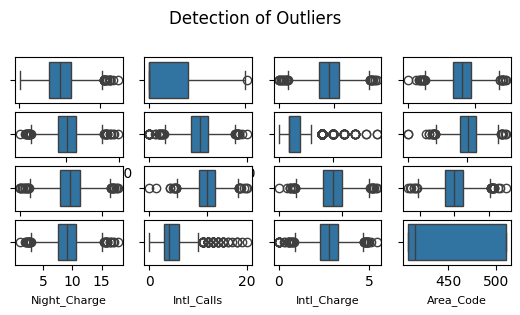

<Figure size 640x480 with 0 Axes>

In [67]:
## Checking outliers [Before]

plt.figure(figure=(20,20))
plt.suptitle("Detection of Outliers")
pltn= 1
column_exclude= ['Churn','Intl_Plan','Vmail_Plan']

for i in df.columns:
    if i not in column_exclude and pltn <=16:
        plt.subplot(7,4,pltn)
        sns.boxplot(df[i],orient="h")
        plt.xlabel(i, fontsize= 8)
        pltn +=1
plt.show()
plt.tight_layout()


## 5. Feature engineering

In [68]:
## replace categorical data to numeric 
df["Intl_Plan"].replace({"yes":1,"no":0},inplace=True)
df

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128,25,265.1,197.4,244.7,10.0,1,no,0,yes,110,45.07,99,16.78,91,11.01,3,2.70,415
1,107,26,161.6,195.5,254.4,13.7,1,no,0,yes,123,27.47,103,16.62,103,11.45,3,3.70,415
2,137,0,243.4,121.2,162.6,12.2,0,no,0,no,114,41.38,110,10.30,104,7.32,5,3.29,415
3,84,0,299.4,61.9,196.9,6.6,2,no,1,no,71,50.90,88,5.26,89,8.86,7,1.78,408
4,75,0,166.7,148.3,186.9,10.1,3,no,1,no,113,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,36,156.2,215.5,279.1,9.9,2,no,0,yes,77,26.55,126,18.32,83,12.56,6,2.67,415
3329,68,0,231.1,153.4,191.3,9.6,3,no,0,no,57,39.29,55,13.04,123,8.61,4,2.59,415
3330,28,0,180.8,288.8,191.9,14.1,2,no,0,no,109,30.74,58,24.55,91,8.64,6,3.81,510
3331,184,0,213.8,159.6,139.2,5.0,2,no,1,no,105,36.35,84,13.57,137,6.26,10,1.35,510


In [69]:
df["Vmail_Plan"].replace({"yes":1,"no":0},inplace=True)
df

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128,25,265.1,197.4,244.7,10.0,1,no,0,1,110,45.07,99,16.78,91,11.01,3,2.70,415
1,107,26,161.6,195.5,254.4,13.7,1,no,0,1,123,27.47,103,16.62,103,11.45,3,3.70,415
2,137,0,243.4,121.2,162.6,12.2,0,no,0,0,114,41.38,110,10.30,104,7.32,5,3.29,415
3,84,0,299.4,61.9,196.9,6.6,2,no,1,0,71,50.90,88,5.26,89,8.86,7,1.78,408
4,75,0,166.7,148.3,186.9,10.1,3,no,1,0,113,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,36,156.2,215.5,279.1,9.9,2,no,0,1,77,26.55,126,18.32,83,12.56,6,2.67,415
3329,68,0,231.1,153.4,191.3,9.6,3,no,0,0,57,39.29,55,13.04,123,8.61,4,2.59,415
3330,28,0,180.8,288.8,191.9,14.1,2,no,0,0,109,30.74,58,24.55,91,8.64,6,3.81,510
3331,184,0,213.8,159.6,139.2,5.0,2,no,1,0,105,36.35,84,13.57,137,6.26,10,1.35,510


In [70]:
df["Churn"].replace({"yes":1,"no":0},inplace=True)
df

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128,25,265.1,197.4,244.7,10.0,1,0,0,1,110,45.07,99,16.78,91,11.01,3,2.70,415
1,107,26,161.6,195.5,254.4,13.7,1,0,0,1,123,27.47,103,16.62,103,11.45,3,3.70,415
2,137,0,243.4,121.2,162.6,12.2,0,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,415
3,84,0,299.4,61.9,196.9,6.6,2,0,1,0,71,50.90,88,5.26,89,8.86,7,1.78,408
4,75,0,166.7,148.3,186.9,10.1,3,0,1,0,113,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192,36,156.2,215.5,279.1,9.9,2,0,0,1,77,26.55,126,18.32,83,12.56,6,2.67,415
3329,68,0,231.1,153.4,191.3,9.6,3,0,0,0,57,39.29,55,13.04,123,8.61,4,2.59,415
3330,28,0,180.8,288.8,191.9,14.1,2,0,0,0,109,30.74,58,24.55,91,8.64,6,3.81,510
3331,184,0,213.8,159.6,139.2,5.0,2,0,1,0,105,36.35,84,13.57,137,6.26,10,1.35,510


In [71]:
## handling outlirs 
def find_outliers(l):
    q1= df[l].quantile(0.25)
    q3= df[l].quantile(0.75)
    iqr= q3-q1
    lower_tail= q1-1.5*iqr
    upper_tail= q3+1.5*iqr
    print(f"Lower_tail:{lower_tail}")
    print(f"Upper_TailL:{upper_tail}")
    outlier= df[(df[l]<lower_tail)|(df[l]>upper_tail)]
    df[l]= np.where(df[l]<lower_tail,lower_tail,np.where(df[l]>upper_tail,upper_tail,df[l]))
    return df

In [72]:
find_outliers("Account_Length")

Lower_tail:-5.5
Upper_TailL:206.5


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25,265.1,197.4,244.7,10.0,1,0,0,1,110,45.07,99,16.78,91,11.01,3,2.70,415
1,107.0,26,161.6,195.5,254.4,13.7,1,0,0,1,123,27.47,103,16.62,103,11.45,3,3.70,415
2,137.0,0,243.4,121.2,162.6,12.2,0,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,415
3,84.0,0,299.4,61.9,196.9,6.6,2,0,1,0,71,50.90,88,5.26,89,8.86,7,1.78,408
4,75.0,0,166.7,148.3,186.9,10.1,3,0,1,0,113,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36,156.2,215.5,279.1,9.9,2,0,0,1,77,26.55,126,18.32,83,12.56,6,2.67,415
3329,68.0,0,231.1,153.4,191.3,9.6,3,0,0,0,57,39.29,55,13.04,123,8.61,4,2.59,415
3330,28.0,0,180.8,288.8,191.9,14.1,2,0,0,0,109,30.74,58,24.55,91,8.64,6,3.81,510
3331,184.0,0,213.8,159.6,139.2,5.0,2,0,1,0,105,36.35,84,13.57,137,6.26,10,1.35,510


In [73]:
find_outliers("Vmail_Message")

Lower_tail:-30.0
Upper_TailL:50.0


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.4,244.7,10.0,1,0,0,1,110,45.07,99,16.78,91,11.01,3,2.70,415
1,107.0,26.0,161.6,195.5,254.4,13.7,1,0,0,1,123,27.47,103,16.62,103,11.45,3,3.70,415
2,137.0,0.0,243.4,121.2,162.6,12.2,0,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,415
3,84.0,0.0,299.4,61.9,196.9,6.6,2,0,1,0,71,50.90,88,5.26,89,8.86,7,1.78,408
4,75.0,0.0,166.7,148.3,186.9,10.1,3,0,1,0,113,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.5,279.1,9.9,2,0,0,1,77,26.55,126,18.32,83,12.56,6,2.67,415
3329,68.0,0.0,231.1,153.4,191.3,9.6,3,0,0,0,57,39.29,55,13.04,123,8.61,4,2.59,415
3330,28.0,0.0,180.8,288.8,191.9,14.1,2,0,0,0,109,30.74,58,24.55,91,8.64,6,3.81,510
3331,184.0,0.0,213.8,159.6,139.2,5.0,2,0,1,0,105,36.35,84,13.57,137,6.26,10,1.35,510


In [74]:
find_outliers("CustServ_Calls")

Lower_tail:-0.5
Upper_TailL:3.5


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.4,244.7,10.0,1.0,0,0,1,110,45.07,99,16.78,91,11.01,3,2.70,415
1,107.0,26.0,161.6,195.5,254.4,13.7,1.0,0,0,1,123,27.47,103,16.62,103,11.45,3,3.70,415
2,137.0,0.0,243.4,121.2,162.6,12.2,0.0,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,415
3,84.0,0.0,299.4,61.9,196.9,6.6,2.0,0,1,0,71,50.90,88,5.26,89,8.86,7,1.78,408
4,75.0,0.0,166.7,148.3,186.9,10.1,3.0,0,1,0,113,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.5,279.1,9.9,2.0,0,0,1,77,26.55,126,18.32,83,12.56,6,2.67,415
3329,68.0,0.0,231.1,153.4,191.3,9.6,3.0,0,0,0,57,39.29,55,13.04,123,8.61,4,2.59,415
3330,28.0,0.0,180.8,288.8,191.9,14.1,2.0,0,0,0,109,30.74,58,24.55,91,8.64,6,3.81,510
3331,184.0,0.0,213.8,159.6,139.2,5.0,2.0,0,1,0,105,36.35,84,13.57,137,6.26,10,1.35,510


In [75]:
find_outliers("Day_Calls")

Lower_tail:46.5
Upper_TailL:154.5


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.4,244.7,10.0,1.0,0,0,1,110.0,45.07,99,16.78,91,11.01,3,2.70,415
1,107.0,26.0,161.6,195.5,254.4,13.7,1.0,0,0,1,123.0,27.47,103,16.62,103,11.45,3,3.70,415
2,137.0,0.0,243.4,121.2,162.6,12.2,0.0,0,0,0,114.0,41.38,110,10.30,104,7.32,5,3.29,415
3,84.0,0.0,299.4,61.9,196.9,6.6,2.0,0,1,0,71.0,50.90,88,5.26,89,8.86,7,1.78,408
4,75.0,0.0,166.7,148.3,186.9,10.1,3.0,0,1,0,113.0,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.5,279.1,9.9,2.0,0,0,1,77.0,26.55,126,18.32,83,12.56,6,2.67,415
3329,68.0,0.0,231.1,153.4,191.3,9.6,3.0,0,0,0,57.0,39.29,55,13.04,123,8.61,4,2.59,415
3330,28.0,0.0,180.8,288.8,191.9,14.1,2.0,0,0,0,109.0,30.74,58,24.55,91,8.64,6,3.81,510
3331,184.0,0.0,213.8,159.6,139.2,5.0,2.0,0,1,0,105.0,36.35,84,13.57,137,6.26,10,1.35,510


In [76]:
find_outliers("Day_Charge")

Lower_tail:5.890000000000001
Upper_TailL:55.33


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.4,244.7,10.0,1.0,0,0,1,110.0,45.07,99,16.78,91,11.01,3,2.70,415
1,107.0,26.0,161.6,195.5,254.4,13.7,1.0,0,0,1,123.0,27.47,103,16.62,103,11.45,3,3.70,415
2,137.0,0.0,243.4,121.2,162.6,12.2,0.0,0,0,0,114.0,41.38,110,10.30,104,7.32,5,3.29,415
3,84.0,0.0,299.4,61.9,196.9,6.6,2.0,0,1,0,71.0,50.90,88,5.26,89,8.86,7,1.78,408
4,75.0,0.0,166.7,148.3,186.9,10.1,3.0,0,1,0,113.0,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.5,279.1,9.9,2.0,0,0,1,77.0,26.55,126,18.32,83,12.56,6,2.67,415
3329,68.0,0.0,231.1,153.4,191.3,9.6,3.0,0,0,0,57.0,39.29,55,13.04,123,8.61,4,2.59,415
3330,28.0,0.0,180.8,288.8,191.9,14.1,2.0,0,0,0,109.0,30.74,58,24.55,91,8.64,6,3.81,510
3331,184.0,0.0,213.8,159.6,139.2,5.0,2.0,0,1,0,105.0,36.35,84,13.57,137,6.26,10,1.35,510


In [77]:
find_outliers("Day_Mins")

Lower_tail:34.64999999999996
Upper_TailL:325.45000000000005


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.4,244.7,10.0,1.0,0,0,1,110.0,45.07,99,16.78,91,11.01,3,2.70,415
1,107.0,26.0,161.6,195.5,254.4,13.7,1.0,0,0,1,123.0,27.47,103,16.62,103,11.45,3,3.70,415
2,137.0,0.0,243.4,121.2,162.6,12.2,0.0,0,0,0,114.0,41.38,110,10.30,104,7.32,5,3.29,415
3,84.0,0.0,299.4,61.9,196.9,6.6,2.0,0,1,0,71.0,50.90,88,5.26,89,8.86,7,1.78,408
4,75.0,0.0,166.7,148.3,186.9,10.1,3.0,0,1,0,113.0,28.34,122,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.5,279.1,9.9,2.0,0,0,1,77.0,26.55,126,18.32,83,12.56,6,2.67,415
3329,68.0,0.0,231.1,153.4,191.3,9.6,3.0,0,0,0,57.0,39.29,55,13.04,123,8.61,4,2.59,415
3330,28.0,0.0,180.8,288.8,191.9,14.1,2.0,0,0,0,109.0,30.74,58,24.55,91,8.64,6,3.81,510
3331,184.0,0.0,213.8,159.6,139.2,5.0,2.0,0,1,0,105.0,36.35,84,13.57,137,6.26,10,1.35,510


In [78]:
find_outliers("Eve_Calls")

Lower_tail:46.5
Upper_TailL:154.5


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.4,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91,11.01,3,2.70,415
1,107.0,26.0,161.6,195.5,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103,11.45,3,3.70,415
2,137.0,0.0,243.4,121.2,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104,7.32,5,3.29,415
3,84.0,0.0,299.4,61.9,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.26,89,8.86,7,1.78,408
4,75.0,0.0,166.7,148.3,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.5,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83,12.56,6,2.67,415
3329,68.0,0.0,231.1,153.4,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123,8.61,4,2.59,415
3330,28.0,0.0,180.8,288.8,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91,8.64,6,3.81,510
3331,184.0,0.0,213.8,159.6,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137,6.26,10,1.35,510


In [79]:
find_outliers("Eve_Charge")

Lower_tail:5.4
Upper_TailL:28.759999999999998


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.4,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91,11.01,3,2.70,415
1,107.0,26.0,161.6,195.5,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103,11.45,3,3.70,415
2,137.0,0.0,243.4,121.2,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104,7.32,5,3.29,415
3,84.0,0.0,299.4,61.9,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.40,89,8.86,7,1.78,408
4,75.0,0.0,166.7,148.3,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.5,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83,12.56,6,2.67,415
3329,68.0,0.0,231.1,153.4,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123,8.61,4,2.59,415
3330,28.0,0.0,180.8,288.8,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91,8.64,6,3.81,510
3331,184.0,0.0,213.8,159.6,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137,6.26,10,1.35,510


In [80]:
find_outliers("Eve_Mins")

Lower_tail:63.54999999999997
Upper_TailL:338.35


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.40,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91,11.01,3,2.70,415
1,107.0,26.0,161.6,195.50,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103,11.45,3,3.70,415
2,137.0,0.0,243.4,121.20,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104,7.32,5,3.29,415
3,84.0,0.0,299.4,63.55,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.40,89,8.86,7,1.78,408
4,75.0,0.0,166.7,148.30,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121,8.41,3,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.50,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83,12.56,6,2.67,415
3329,68.0,0.0,231.1,153.40,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123,8.61,4,2.59,415
3330,28.0,0.0,180.8,288.80,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91,8.64,6,3.81,510
3331,184.0,0.0,213.8,159.60,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137,6.26,10,1.35,510


In [81]:
find_outliers("Intl_Calls")

Lower_tail:-1.5
Upper_TailL:10.5


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.40,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91,11.01,3.0,2.70,415
1,107.0,26.0,161.6,195.50,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103,11.45,3.0,3.70,415
2,137.0,0.0,243.4,121.20,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104,7.32,5.0,3.29,415
3,84.0,0.0,299.4,63.55,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.40,89,8.86,7.0,1.78,408
4,75.0,0.0,166.7,148.30,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121,8.41,3.0,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.50,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83,12.56,6.0,2.67,415
3329,68.0,0.0,231.1,153.40,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123,8.61,4.0,2.59,415
3330,28.0,0.0,180.8,288.80,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91,8.64,6.0,3.81,510
3331,184.0,0.0,213.8,159.60,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137,6.26,10.0,1.35,510


In [82]:
find_outliers("Intl_Charge")

Lower_tail:0.8449999999999995
Upper_TailL:4.7250000000000005


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.40,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91,11.01,3.0,2.70,415
1,107.0,26.0,161.6,195.50,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103,11.45,3.0,3.70,415
2,137.0,0.0,243.4,121.20,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104,7.32,5.0,3.29,415
3,84.0,0.0,299.4,63.55,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.40,89,8.86,7.0,1.78,408
4,75.0,0.0,166.7,148.30,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121,8.41,3.0,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.50,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83,12.56,6.0,2.67,415
3329,68.0,0.0,231.1,153.40,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123,8.61,4.0,2.59,415
3330,28.0,0.0,180.8,288.80,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91,8.64,6.0,3.81,510
3331,184.0,0.0,213.8,159.60,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137,6.26,10.0,1.35,510


In [83]:
find_outliers("Night_Calls")

Lower_tail:48.0
Upper_TailL:152.0


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.40,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91.0,11.01,3.0,2.70,415
1,107.0,26.0,161.6,195.50,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103.0,11.45,3.0,3.70,415
2,137.0,0.0,243.4,121.20,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104.0,7.32,5.0,3.29,415
3,84.0,0.0,299.4,63.55,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.40,89.0,8.86,7.0,1.78,408
4,75.0,0.0,166.7,148.30,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121.0,8.41,3.0,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.50,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83.0,12.56,6.0,2.67,415
3329,68.0,0.0,231.1,153.40,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123.0,8.61,4.0,2.59,415
3330,28.0,0.0,180.8,288.80,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91.0,8.64,6.0,3.81,510
3331,184.0,0.0,213.8,159.60,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137.0,6.26,10.0,1.35,510


In [84]:
find_outliers("Night_Charge")

Lower_tail:2.914999999999999
Upper_TailL:15.195


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.40,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91.0,11.01,3.0,2.70,415
1,107.0,26.0,161.6,195.50,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103.0,11.45,3.0,3.70,415
2,137.0,0.0,243.4,121.20,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104.0,7.32,5.0,3.29,415
3,84.0,0.0,299.4,63.55,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.40,89.0,8.86,7.0,1.78,408
4,75.0,0.0,166.7,148.30,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121.0,8.41,3.0,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.50,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83.0,12.56,6.0,2.67,415
3329,68.0,0.0,231.1,153.40,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123.0,8.61,4.0,2.59,415
3330,28.0,0.0,180.8,288.80,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91.0,8.64,6.0,3.81,510
3331,184.0,0.0,213.8,159.60,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137.0,6.26,10.0,1.35,510


In [85]:
find_outliers("Night_Mins")

Lower_tail:64.54999999999998
Upper_TailL:337.75


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.40,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91.0,11.01,3.0,2.70,415
1,107.0,26.0,161.6,195.50,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103.0,11.45,3.0,3.70,415
2,137.0,0.0,243.4,121.20,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104.0,7.32,5.0,3.29,415
3,84.0,0.0,299.4,63.55,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.40,89.0,8.86,7.0,1.78,408
4,75.0,0.0,166.7,148.30,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121.0,8.41,3.0,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.50,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83.0,12.56,6.0,2.67,415
3329,68.0,0.0,231.1,153.40,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123.0,8.61,4.0,2.59,415
3330,28.0,0.0,180.8,288.80,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91.0,8.64,6.0,3.81,510
3331,184.0,0.0,213.8,159.60,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137.0,6.26,10.0,1.35,510


In [86]:
find_outliers("Intl_Mins")

Lower_tail:3.1000000000000005
Upper_TailL:17.5


,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25.0,265.1,197.40,244.7,10.0,1.0,0,0,1,110.0,45.07,99.0,16.78,91.0,11.01,3.0,2.70,415
1,107.0,26.0,161.6,195.50,254.4,13.7,1.0,0,0,1,123.0,27.47,103.0,16.62,103.0,11.45,3.0,3.70,415
2,137.0,0.0,243.4,121.20,162.6,12.2,0.0,0,0,0,114.0,41.38,110.0,10.30,104.0,7.32,5.0,3.29,415
3,84.0,0.0,299.4,63.55,196.9,6.6,2.0,0,1,0,71.0,50.90,88.0,5.40,89.0,8.86,7.0,1.78,408
4,75.0,0.0,166.7,148.30,186.9,10.1,3.0,0,1,0,113.0,28.34,122.0,12.61,121.0,8.41,3.0,2.73,415
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,192.0,36.0,156.2,215.50,279.1,9.9,2.0,0,0,1,77.0,26.55,126.0,18.32,83.0,12.56,6.0,2.67,415
3329,68.0,0.0,231.1,153.40,191.3,9.6,3.0,0,0,0,57.0,39.29,55.0,13.04,123.0,8.61,4.0,2.59,415
3330,28.0,0.0,180.8,288.80,191.9,14.1,2.0,0,0,0,109.0,30.74,58.0,24.55,91.0,8.64,6.0,3.81,510
3331,184.0,0.0,213.8,159.60,139.2,5.0,2.0,0,1,0,105.0,36.35,84.0,13.57,137.0,6.26,10.0,1.35,510


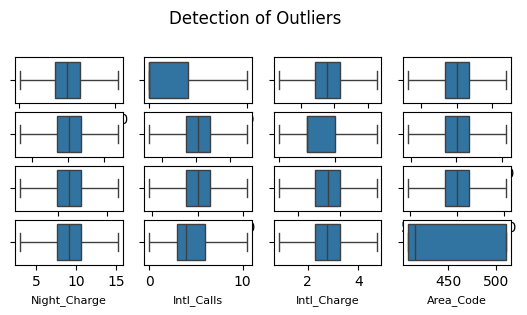

<Figure size 640x480 with 0 Axes>

In [87]:
## Checking outliers [After] 

plt.figure(figure=(20,20))
plt.suptitle("Detection of Outliers")
pltn= 1
column_exclude= ['Churn','Intl_Plan','Vmail_Plan']

for i in df.columns:
    if i not in column_exclude and pltn <=16:
        plt.subplot(7,4,pltn)
        sns.boxplot(df[i],orient="h")
        plt.xlabel(i, fontsize= 8)
        pltn +=1
plt.show()
plt.tight_layout()



## 6. Feature Selection 

## Assum 1. Linearity

In [88]:
df.corr()

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Churn,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
Account_Length,1.000000,-0.004007,0.007016,-0.006579,-0.009674,0.012501,-0.004441,0.016275,0.024906,0.003586,0.038608,0.007014,0.018693,-0.006568,-0.013312,-0.009671,0.023650,0.012563,-0.013329
Vmail_Message,-0.004007,1.000000,0.000998,0.017163,0.007660,0.001004,-0.020620,-0.089725,0.008753,0.956956,-0.010258,0.000995,-0.006833,0.017180,0.007091,0.007638,0.010168,0.001014,-0.001983
Day_Mins,0.007016,0.000998,1.000000,0.006675,0.003231,-0.011832,-0.006585,0.204788,0.049078,-0.001364,0.002755,1.000000,0.016928,0.006661,0.023330,0.003205,0.007595,-0.011773,-0.007973
Eve_Mins,-0.006579,0.017163,0.006675,1.000000,-0.013163,-0.012030,-0.016544,0.092109,0.018323,0.021118,-0.021362,0.006683,-0.016497,1.000000,0.006642,-0.013185,0.006744,-0.012076,0.003357
Night_Mins,-0.009674,0.007660,0.003231,-0.013163,1.000000,-0.014236,-0.008434,0.036176,-0.029411,0.005757,0.022214,0.003231,-0.000826,-0.013170,0.010602,0.999999,-0.005731,-0.014180,-0.006442
Intl_Mins,0.012501,0.001004,-0.011832,-0.012030,-0.014236,1.000000,-0.012441,0.066554,0.044909,-0.002495,0.021812,-0.011834,0.008145,-0.012038,-0.012457,-0.014244,0.025079,0.999992,-0.018719
CustServ_Calls,-0.004441,-0.020620,-0.006585,-0.016544,-0.008434,-0.012441,1.000000,0.152404,-0.026425,-0.024929,-0.019720,-0.006590,-0.000565,-0.016545,-0.012571,-0.008427,-0.005659,-0.012480,0.033931
Churn,0.016275,-0.089725,0.204788,0.092109,0.036176,0.066554,0.152404,1.000000,0.259852,-0.102148,0.019816,0.204789,0.008121,0.092100,0.006115,0.036179,-0.059535,0.066563,0.006174
Intl_Plan,0.024906,0.008753,0.049078,0.018323,-0.029411,0.044909,-0.026425,0.259852,1.000000,0.006006,0.003474,0.049080,0.005605,0.018330,0.012584,-0.029426,0.015077,0.044816,0.048551
Vmail_Plan,0.003586,0.956956,-0.001364,0.021118,0.005757,-0.002495,-0.024929,-0.102148,0.006006,1.000000,-0.011757,-0.001366,-0.007288,0.021133,0.015638,0.005738,0.003482,-0.002469,-0.000747


<Axes: >

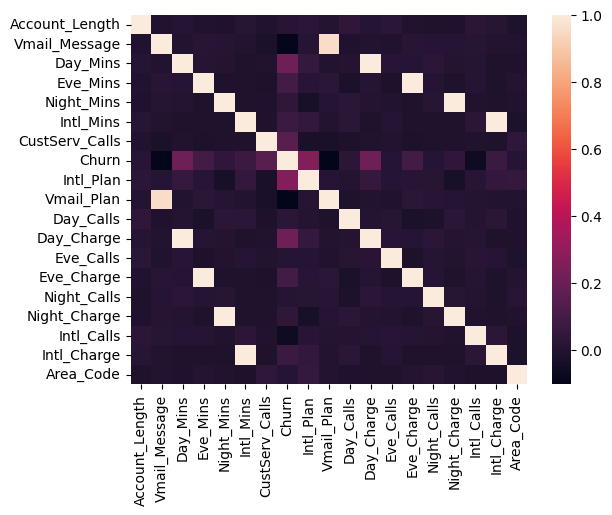

In [89]:
sns.heatmap(df.corr())

<Axes: >

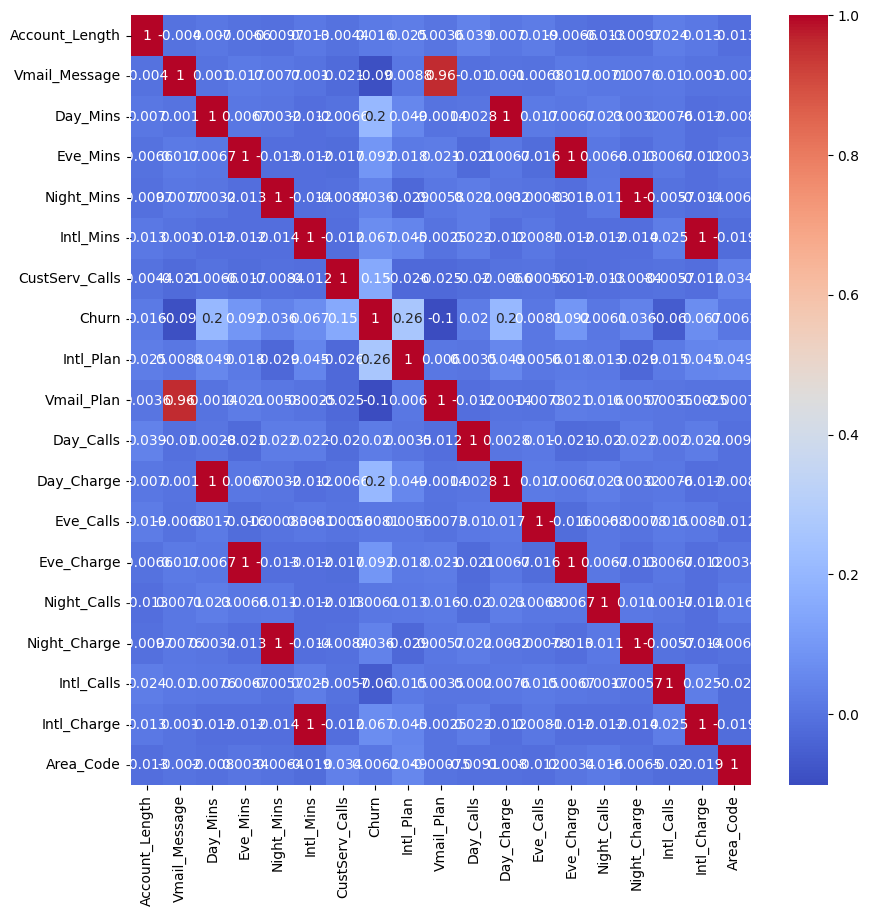

In [90]:
plt.figure(figsize=(10,10))
sns.heatmap(df.corr(),cmap="coolwarm",annot=True)

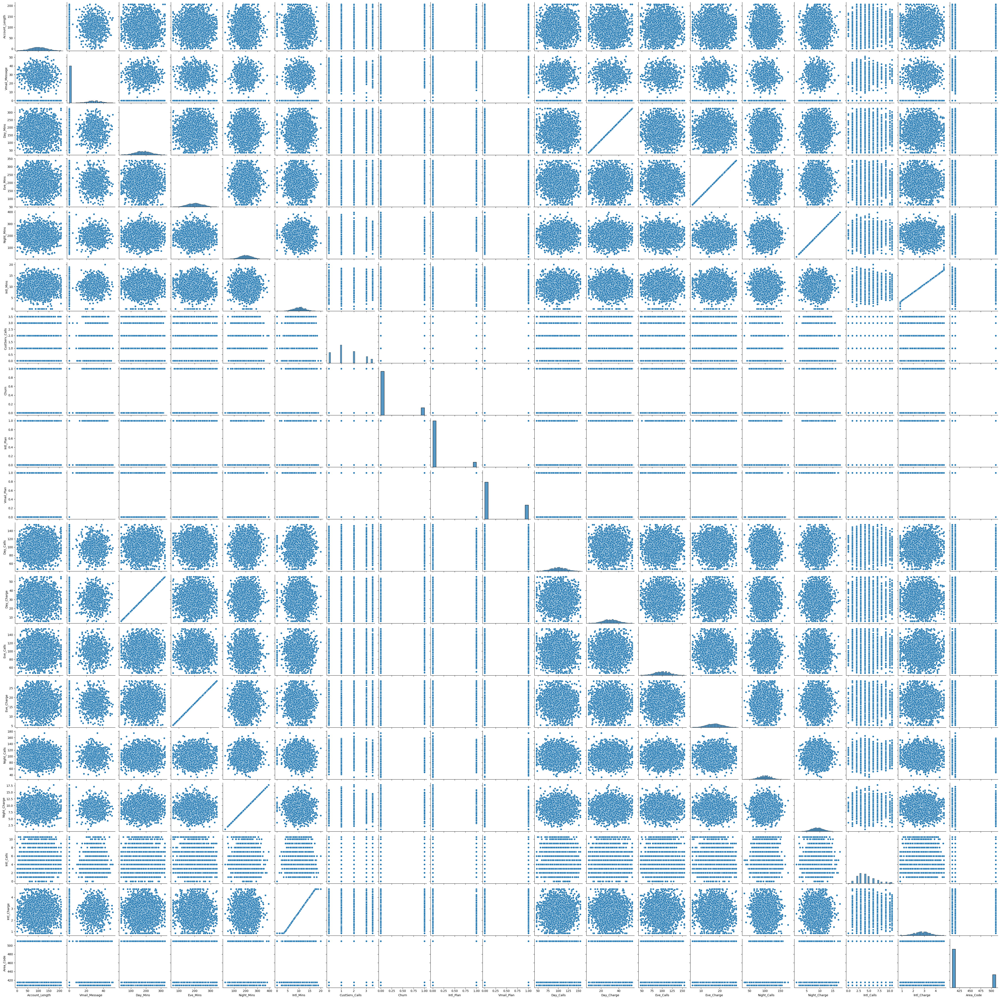

In [ ]:
## sns.pairplot(df)

<Figure size 2000x2000 with 0 Axes>

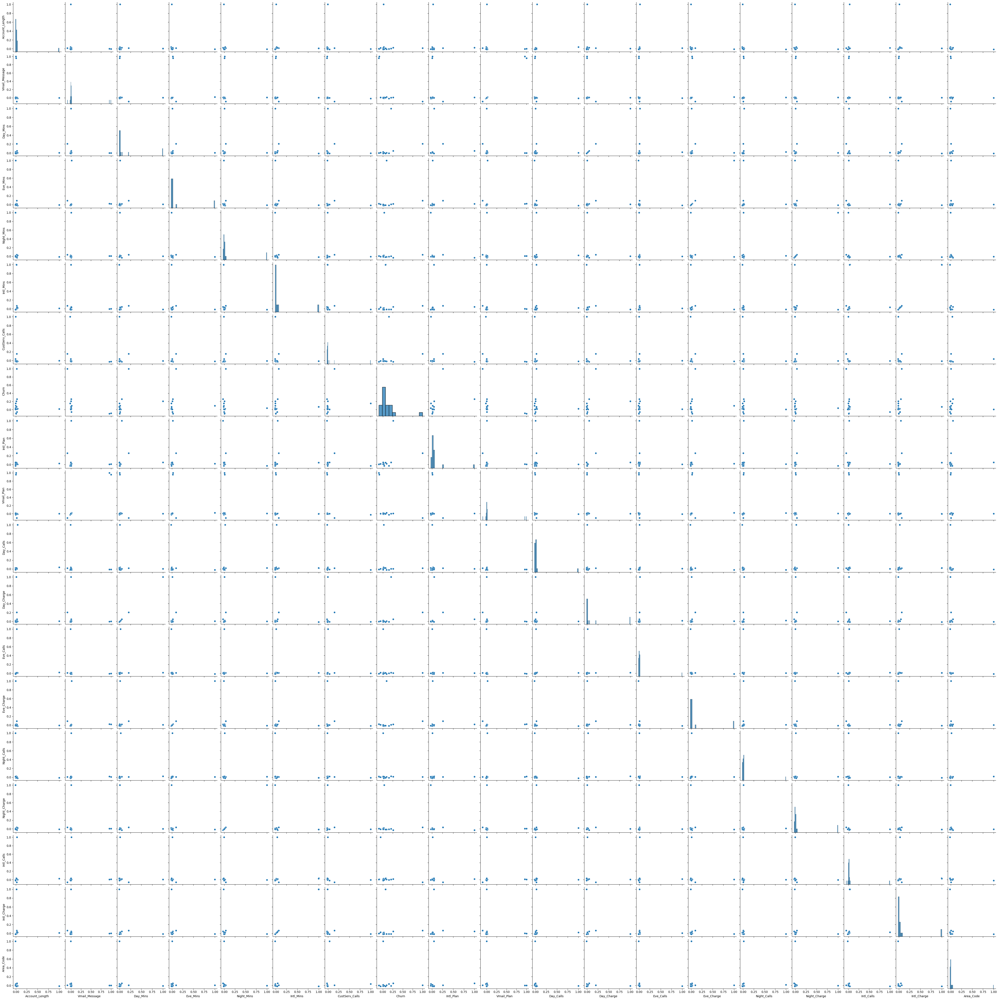

In [ ]:
plt.figure(figsize=(20,20))
sns.pairplot(df.corr())

## Assum 2. No multicolinearity

In [91]:
vif_df= pd.DataFrame()
df1=df.iloc[:,[0,1,2,3,4,5,6,8,9,10,11,12,13,14,15,16,17,18]]
vif_df["Columns"]=df1.columns
vif_df

,Columns
0,Account_Length
1,Vmail_Message
2,Day_Mins
3,Eve_Mins
4,Night_Mins
5,Intl_Mins
6,CustServ_Calls
7,Intl_Plan
8,Vmail_Plan
9,Day_Calls


In [92]:
vif_list=[]
for i in range(df1.shape[1]):
    vif = variance_inflation_factor(df1.to_numpy(),i)
    vif_list.append(vif)
vif_list

[7.357031995986385,
 16.08101361388995,
 125088396.38710973,
 37528384.894254655,
 10165427.235488418,
 950728.0491583423,
 2.770346490824281,
 1.117503154194424,
 16.46825979926022,
 24.1181596076599,
 125092623.08359885,
 24.142566453220542,
 37529271.328841776,
 24.92560170921195,
 10166550.537709393,
 4.7427873272540495,
 951575.3365378104,
 61.816965639177596]

In [93]:
vif_df["VIF"]=vif_list
vif_df

,Columns,VIF
0,Account_Length,7.357032e+00
1,Vmail_Message,1.608101e+01
2,Day_Mins,1.250884e+08
3,Eve_Mins,3.752838e+07
4,Night_Mins,1.016543e+07
5,Intl_Mins,9.507280e+05
6,CustServ_Calls,2.770346e+00
7,Intl_Plan,1.117503e+00
8,Vmail_Plan,1.646826e+01
9,Day_Calls,2.411816e+01


#### Train Test Split 

In [95]:
x=df1   ## independent column 
y= df["Churn"]  ## Target feature 

In [96]:
xtrain, xtest,ytrain ,ytest= train_test_split(x,y,test_size=0.2,stratify=y)

In [97]:
print(f"xtrain:{xtrain.shape}")
print(f"ytrain:{ytrain.shape}")
print(f"xtest:{xtest.shape}")
print(f"ytest:{ytest.shape}")

xtrain:(2666, 18)
ytrain:(2666,)
xtest:(667, 18)
ytest:(667,)


## Algorithm 1 Logistic Regression 

## 7. Model Training

In [98]:
log_regression= LogisticRegression()
log_regression_model= log_regression.fit(xtrain,ytrain)
log_regression_model

LogisticRegression()

## 8. Model Evaluation

In [99]:
ytrain_pred= log_regression_model.predict(xtrain)
ytrain_pred


array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [100]:
confn_matric= confusion_matrix(ytrain,ytrain_pred)
print(f"Confusion Matrix:\n{confn_matric}")
print("-"*40)

acc_scr= accuracy_score(ytrain,ytrain_pred)
print(f"Accuracy:\n{acc_scr}")
print("-"*40)

class_rep= classification_report(ytrain,ytrain_pred)
print(f"classification_report:\n{class_rep}")


Confusion Matrix:
[[2264   16]
 [ 352   34]]
----------------------------------------
Accuracy:
0.8619654913728432
----------------------------------------
classification_report:
              precision    recall  f1-score   support

           0       0.87      0.99      0.92      2280
           1       0.68      0.09      0.16       386

    accuracy                           0.86      2666
   macro avg       0.77      0.54      0.54      2666
weighted avg       0.84      0.86      0.81      2666



In [101]:
ytest_pred= log_regression_model.predict(xtest)
ytest_pred

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [102]:
confn_matric= confusion_matrix(ytest,ytest_pred)
print(f"Confusion Matrix:\n{confn_matric}")
print("-"*40)

acc_scr= accuracy_score(ytest,ytest_pred)
print(f"Accuracy:\n{acc_scr}")
print("-"*40)

class_rep= classification_report(ytest,ytest_pred)
print(f"classification_report:\n{class_rep}")

Confusion Matrix:
[[566   4]
 [ 87  10]]
----------------------------------------
Accuracy:
0.863568215892054
----------------------------------------
classification_report:
              precision    recall  f1-score   support

           0       0.87      0.99      0.93       570
           1       0.71      0.10      0.18        97

    accuracy                           0.86       667
   macro avg       0.79      0.55      0.55       667
weighted avg       0.84      0.86      0.82       667



## Algorithm 2 Decision Tree 

## 7. Model Training

In [103]:
dt_class= DecisionTreeClassifier()
dt_class_model= dt_class.fit(xtrain,ytrain)
dt_class_model

DecisionTreeClassifier()

## 8. Model Evaluation 

In [104]:
## fro training data
ytrain_pred = dt_class_model.predict(xtrain)

In [105]:
confn_matric= confusion_matrix(ytrain,ytrain_pred)
print(f"confusion Matrix:{confn_matric}")
print("_"*40)

acc_scr= accuracy_score(ytrain,ytrain_pred)
print(f"Accuracy:\n{acc_scr}")
print("_"*40)

class_rep= classification_report(ytrain,ytrain_pred)
print(f"Classification Report: \n{class_rep}")

confusion Matrix:[[2280    0]
 [   0  386]]
________________________________________
Accuracy:
1.0
________________________________________
Classification Report: 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2280
           1       1.00      1.00      1.00       386

    accuracy                           1.00      2666
   macro avg       1.00      1.00      1.00      2666
weighted avg       1.00      1.00      1.00      2666



In [106]:
## for testing data 
ytest_pred= dt_class_model.predict(xtest)

In [107]:
confn_matric= confusion_matrix(ytest,ytest_pred)
print(f"confusion Matrix: {confn_matric}")
print("_"*40)

acc_scr= accuracy_score(ytest,ytest_pred)
print(f"Accuracy: \n{acc_scr}")
print("_"*40)

class_rep= classification_report(ytest,ytest_pred)
print(f"Classification Report: \n{class_rep}")

confusion Matrix: [[541  29]
 [ 26  71]]
________________________________________
Accuracy: 
0.9175412293853074
________________________________________
Classification Report: 
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       570
           1       0.71      0.73      0.72        97

    accuracy                           0.92       667
   macro avg       0.83      0.84      0.84       667
weighted avg       0.92      0.92      0.92       667



## Tree Plot

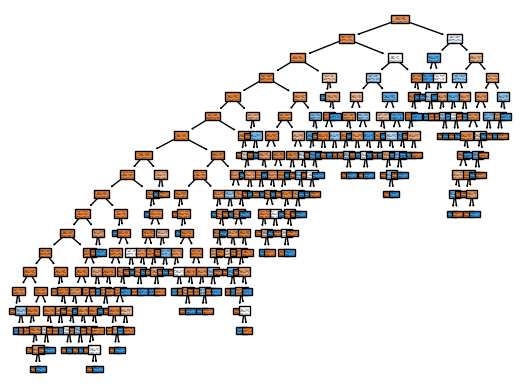

In [ ]:
## plot_tree(dt_class_model,class_names=["yes","no"],filled=True)    ### Filled=true means the tree dig shows colours
## plt.savefig("dec_tree.png")

## Algorithm 1.1 Decision Tree with Hyperparameter Tunning

In [108]:
hyperpara={
    "criterion":["entropy","gini"],
    "max_depth":np.arange(5,20),
    "min_samples_split": np.arange(5,20),
    "min_samples_leaf": np.arange(5,20)
}

#### Gridesearch cv

In [109]:
grid_searchcv= GridSearchCV(dt_class_model,hyperpara,cv=5)

In [110]:
random_searchcv= RandomizedSearchCV(dt_class_model,hyperpara,cv=5)

In [111]:
random_searchcv=random_searchcv.fit(xtrain,ytrain)
random_searchcv

RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(),
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]),
                                        'min_samples_leaf': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]),
                                        'min_samples_split': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19])})

In [112]:
random_searchcv.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=13, min_samples_leaf=19,
                       min_samples_split=10)

In [113]:
dt_hypo= DecisionTreeClassifier(criterion='entropy', max_depth=13, min_samples_leaf=19,min_samples_split=10)
dt_hypo=dt_hypo.fit(xtrain,ytrain)
dt_hypo

DecisionTreeClassifier(criterion='entropy', max_depth=13, min_samples_leaf=19,
                       min_samples_split=10)

In [114]:
dt_hypo_model= dt_hypo.fit(xtrain,ytrain)
dt_hypo_model

DecisionTreeClassifier(criterion='entropy', max_depth=13, min_samples_leaf=19,
                       min_samples_split=10)

## Evaluation

#### For Training Data 

In [115]:
ytrain_pred= dt_hypo_model.predict(xtrain)

In [116]:
confn_matric= confusion_matrix(ytrain,ytrain_pred)
print(f"Confusion Matrix:{confn_matric}")
print("_"*40)

acc_scr= accuracy_score(ytrain,ytrain_pred)
print(f"Accuracy:\n{acc_scr}")
print("_"*40)

class_rep= classification_report(ytrain,ytrain_pred)
print(f"Classification Report:\n{class_rep}")

Confusion Matrix:[[2229   51]
 [  79  307]]
________________________________________
Accuracy:
0.9512378094523631
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      2280
           1       0.86      0.80      0.83       386

    accuracy                           0.95      2666
   macro avg       0.91      0.89      0.90      2666
weighted avg       0.95      0.95      0.95      2666



#### Testing Data

In [117]:
ytest_pred= dt_hypo_model.predict(xtest)

In [118]:
confn_matric= confusion_matrix(ytest,ytest_pred)
print(f"Confusion Matrix:{confn_matric}")
print("_"*40)

acc_scr= accuracy_score(ytest,ytest_pred)
print(f"Accuracy:\n{acc_scr}")
print("_"*40)

class_rep= classification_report(ytest,ytest_pred)
print(f"Classification Report:\n{class_rep}")

Confusion Matrix:[[549  21]
 [ 29  68]]
________________________________________
Accuracy:
0.9250374812593704
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.96      0.96       570
           1       0.76      0.70      0.73        97

    accuracy                           0.93       667
   macro avg       0.86      0.83      0.84       667
weighted avg       0.92      0.93      0.92       667



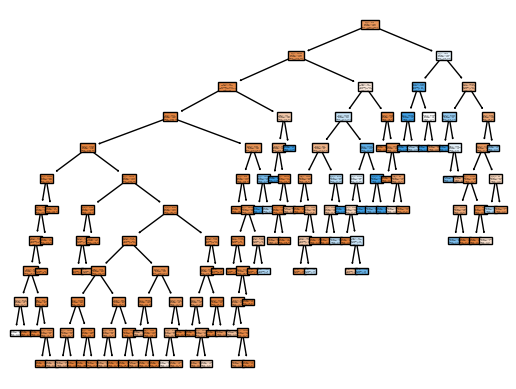

In [ ]:
## plot_tree(dt_hypo_model,class_names=["yes","no"],filled=True)
## plt.savefig("dt_hypo.png")

## Algorithm 3 : Random Forest 

## Model Trainning 

In [119]:
randm_frst= RandomForestClassifier()
randm_frst_model= randm_frst.fit(xtrain,ytrain)
randm_frst_model

RandomForestClassifier()

In [120]:
ytrain_pred= randm_frst_model.predict(xtrain)

In [121]:
def Train_data(t):
    confn_matric= confusion_matrix(ytrain,ytrain_pred)
    print(f"Confusion Matrix : {confn_matric}")
    print("_"*40)

    acc_scr=accuracy_score(ytrain,ytrain_pred)
    print(f"Accuracy:\n{acc_scr}")
    print("_"*40)

    class_rep= classification_report(ytrain,ytrain_pred)
    print(f"Classification Report:\n{class_rep}")
    

In [122]:
Train_data(ytrain_pred)

Confusion Matrix : [[2280    0]
 [   0  386]]
________________________________________
Accuracy:
1.0
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2280
           1       1.00      1.00      1.00       386

    accuracy                           1.00      2666
   macro avg       1.00      1.00      1.00      2666
weighted avg       1.00      1.00      1.00      2666



In [123]:
ytest_pred=randm_frst_model.predict(xtest)

In [124]:
def Test_data(test):
    confn_matric= confusion_matrix(ytest,ytest_pred)
    print(f"Confusion Matrix:{confn_matric}")
    print("_"*40)

    acc_scr= accuracy_score(ytest,ytest_pred)
    print(f"Accuracy:\n{acc_scr}")
    print("_"*40)

    class_rep= classification_report(ytest,ytest_pred)
    print(f"Classification Report:\n{class_rep}")

In [125]:
Test_data(ytest_pred)

Confusion Matrix:[[564   6]
 [ 27  70]]
________________________________________
Accuracy:
0.9505247376311844
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       570
           1       0.92      0.72      0.81        97

    accuracy                           0.95       667
   macro avg       0.94      0.86      0.89       667
weighted avg       0.95      0.95      0.95       667



## Algorithm 3.1 Random Forest With Hyperparameter Tunning

In [126]:
hyperpara={
    "n_estimators" : np.arange(20,100), #n_estimators : number of trees to be traced
    "criterion" : ["entropy","gini"],
    "max_depth" :np.arange(5,25),
    "min_samples_split" : np.arange(5,20),
    "min_samples_leaf" : np.arange(5,15)
}

In [127]:
random_searchcv= RandomizedSearchCV(randm_frst_model,hyperpara,cv=5)  ## cv=5 is a standardise value for randomizedsearch cv
random_searchcv= random_searchcv.fit(xtrain,ytrain)
random_searchcv

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(),
                   param_distributions={'criterion': ['entropy', 'gini'],
                                        'max_depth': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24]),
                                        'min_samples_leaf': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'min_samples_split': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]),
                                        'n_estimators': array([20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36,
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53,
       54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70,
       71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87,
       88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99])})

In [128]:
random_searchcv.best_estimator_

RandomForestClassifier(max_depth=9, min_samples_leaf=5, min_samples_split=18,
                       n_estimators=58)

In [129]:
randm_class_hypo= RandomForestClassifier(criterion='entropy', max_depth=19, min_samples_leaf=5,
                       min_samples_split=12, n_estimators=90)
randm_class_hypo_model= randm_class_hypo.fit(xtrain,ytrain)
randm_class_hypo_model

RandomForestClassifier(criterion='entropy', max_depth=19, min_samples_leaf=5,
                       min_samples_split=12, n_estimators=90)

In [130]:
ytrain_pred= randm_class_hypo_model.predict(xtrain)

In [131]:
Train_data(ytrain_pred)

Confusion Matrix : [[2277    3]
 [  59  327]]
________________________________________
Accuracy:
0.9767441860465116
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      2280
           1       0.99      0.85      0.91       386

    accuracy                           0.98      2666
   macro avg       0.98      0.92      0.95      2666
weighted avg       0.98      0.98      0.98      2666



In [132]:
ytest_pred= randm_class_hypo_model.predict(xtest)

In [133]:
Test_data(ytest_pred)

Confusion Matrix:[[563   7]
 [ 32  65]]
________________________________________
Accuracy:
0.9415292353823088
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.99      0.97       570
           1       0.90      0.67      0.77        97

    accuracy                           0.94       667
   macro avg       0.92      0.83      0.87       667
weighted avg       0.94      0.94      0.94       667



## Algorithm 4: AdaBoost

In [134]:
ada_class= AdaBoostClassifier()
ada_class_model= ada_class.fit(xtrain,ytrain)
ada_class_model

AdaBoostClassifier()

In [135]:
ytrain_pred=ada_class_model.predict(xtrain)
   

In [136]:
Train_data(ytrain_pred)

Confusion Matrix : [[2209   71]
 [ 219  167]]
________________________________________
Accuracy:
0.8912228057014253
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2280
           1       0.70      0.43      0.54       386

    accuracy                           0.89      2666
   macro avg       0.81      0.70      0.74      2666
weighted avg       0.88      0.89      0.88      2666



In [137]:
## for testing data 
ytest_pred= ada_class_model.predict(xtest)

In [138]:
Test_data(ytest_pred)

Confusion Matrix:[[545  25]
 [ 57  40]]
________________________________________
Accuracy:
0.8770614692653673
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.96      0.93       570
           1       0.62      0.41      0.49        97

    accuracy                           0.88       667
   macro avg       0.76      0.68      0.71       667
weighted avg       0.86      0.88      0.87       667



## Algorithm 4.1: AdaBoost with Hyperparameter tunning

In [139]:
hyperpara= {"n_estimators":np.arange(5,50),
            "learning_rate":[0,0.01,0.001,0.00001,0.1,1]}

In [140]:
random_searchcv= RandomizedSearchCV(ada_class_model,hyperpara,cv=5)
random_searchcv.fit(xtrain,ytrain)
random_searchcv

RandomizedSearchCV(cv=5, estimator=AdaBoostClassifier(),
                   param_distributions={'learning_rate': [0, 0.01, 0.001, 1e-05,
                                                          0.1, 1],
                                        'n_estimators': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49])})

In [141]:
random_searchcv.best_estimator_

AdaBoostClassifier(learning_rate=1, n_estimators=31)

In [142]:
ada_class_hypo= AdaBoostClassifier(learning_rate=1, n_estimators=11)
ada_class_hyp_model= ada_class_hypo.fit(xtrain,ytrain)
ada_class_hyp_model

AdaBoostClassifier(learning_rate=1, n_estimators=11)

In [143]:
ytrain_pred= ada_class_hyp_model.predict(xtrain)

In [144]:
Train_data(ytrain_pred)

Confusion Matrix : [[2202   78]
 [ 234  152]]
________________________________________
Accuracy:
0.8829707426856714
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.97      0.93      2280
           1       0.66      0.39      0.49       386

    accuracy                           0.88      2666
   macro avg       0.78      0.68      0.71      2666
weighted avg       0.87      0.88      0.87      2666



In [145]:
ytest_pred= ada_class_hyp_model.predict(xtest)

In [146]:
Test_data(ytest_pred)

Confusion Matrix:[[544  26]
 [ 58  39]]
________________________________________
Accuracy:
0.8740629685157422
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.95      0.93       570
           1       0.60      0.40      0.48        97

    accuracy                           0.87       667
   macro avg       0.75      0.68      0.70       667
weighted avg       0.86      0.87      0.86       667



## Algorithm : SVM (Support Vector machine)

In [ ]:
## svc= SVC()
## svc_model= svc.fit(xtrain,ytrain)
## svc_model

SVC()

In [ ]:
## ytrain_pred=svc_model.predict(xtrain)

In [ ]:
## FOR TRAINING 
## Train_data(ytrain_pred)

Confusion Matrix : [[2280    0]
 [ 386    0]]
________________________________________
Accuracy:
0.8552138034508627
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.86      1.00      0.92      2280
           1       0.00      0.00      0.00       386

    accuracy                           0.86      2666
   macro avg       0.43      0.50      0.46      2666
weighted avg       0.73      0.86      0.79      2666



In [ ]:
## ytest_pred= svc_model.predict(xtest)

In [ ]:
## fro testing 
## Test_data(ytest_pred)

Confusion Matrix:[[570   0]
 [ 97   0]]
________________________________________
Accuracy:
0.8545727136431784
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92       570
           1       0.00      0.00      0.00        97

    accuracy                           0.85       667
   macro avg       0.43      0.50      0.46       667
weighted avg       0.73      0.85      0.79       667



## SVC Hyperparameter Tunning 

In [ ]:
## hyperpara={"kernel":["linear","rbf"],"C":np.arange(1,15)}

In [ ]:
## random_searchcv=RandomizedSearchCV(svc_model,hyperpara,cv=5)
## random_searchcv_model=random_searchcv.fit(xtrain,ytrain)

In [ ]:
## random_searchcv.best_estimator_

SVC(C=10, kernel='linear')

In [ ]:
## svc_hyp= SVC(C=10, kernel='linear')
## svc_hyp_model= svc_hyp.fit(xtrain,ytrain)

In [ ]:
## svc_hyp_model

SVC(C=10, kernel='linear')

In [ ]:
## ytrain_pred= svc_hyp_model.predict(xtrain)

In [ ]:
## Train_data(ytrain_pred)

Confusion Matrix : [[2234   46]
 [ 315   71]]
________________________________________
Accuracy:
0.8645911477869468
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      2280
           1       0.61      0.18      0.28       386

    accuracy                           0.86      2666
   macro avg       0.74      0.58      0.60      2666
weighted avg       0.84      0.86      0.83      2666



In [ ]:
## ytest_pred= svc_hyp_model.predict(xtrain)

In [ ]:
## Train_data(ytest_pred)

Confusion Matrix : [[2234   46]
 [ 315   71]]
________________________________________
Accuracy:
0.8645911477869468
________________________________________
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.98      0.93      2280
           1       0.61      0.18      0.28       386

    accuracy                           0.86      2666
   macro avg       0.74      0.58      0.60      2666
weighted avg       0.84      0.86      0.83      2666



## Save finalized model into Pickle file (Random forset with hyperparameter tunning)

In [ ]:
import pickle 

In [ ]:
with open("final_model.pkl","wb") as f:
    pickle.dump(randm_class_hypo_model,f)

In [ ]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

In [ ]:
test_data= df.head(1).iloc[:,[0,1,2,3,4,5,6,8,9,10,11,12,13,14,15,16,17,18]]
test_data

,Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code
0,128.0,25,265.1,197.4,244.7,10.0,1.0,0,1,110.0,45.07,99.0,16.78,91,11.01,3.0,2.7,415


In [ ]:
with open("final_model.pkl","rb") as f:
    final_model= pickle.load(f)

In [ ]:
Prediction = final_model.predict(test_data)

if Prediction[0]== 0:
    print("Customers using Companies Product(:")
else:
    print("So SAD:) Customers not using Companies Product")

Customers using Companies Product(:


## Take input from user 

In [ ]:
def Churn(Account_Length,Vmail_Message,Day_Mins,Eve_Mins,Night_Mins,Intl_Mins,CustServ_Calls,Intl_Plan,Vmail_Plan,Day_Calls,Day_Charge,Eve_Calls,Eve_Charge,Night_Calls,Night_Charge,Intl_Calls,Intl_Charge,Area_Code):
    test_data= pd.DataFrame({"Account_Length":[Account_Length],
                  "Vmail_Message":[Vmail_Message],
                  "Day_Mins":[Day_Mins],
                  "Eve_Mins":[Eve_Mins],
                  "Night_Mins":[Night_Mins],
                  "Intl_Mins":[Intl_Mins],
                  "CustServ_Calls":[CustServ_Calls],
                  "Intl_Plan":[Intl_Plan],
                  "Vmail_Plan":[Vmail_Plan],
                  "Day_Calls":[Day_Calls],
                  "Day_Charge":[Day_Charge],
                  "Eve_Calls":[Eve_Calls],
                  "Eve_Charge":[Eve_Charge],
                  "Night_Calls":[Night_Calls],
                  "Night_Charge":[Night_Charge],
                  "Intl_Calls":[Intl_Calls],
                  "Intl_Charge":[Intl_Charge],
                  "Area_Code":[Area_Code]})
    with open("model.pkl","rb") as f:
        final_model= pickle.load(f)

    print(f"Predicated Churn:{final_model.predict(test_data)[0]}")



In [ ]:
Churn(137.0,0,243.4,121.20,162.6,12.2,0.0,0,0,114.0,41.38,110.0,10.30,104,7.32,5.0,3.29,415)

Predicated Churn:0


In [ ]:
Churn(1,23,45,65,0,76,65,87,0,9,3,67,98,123,0,87,65,89)

Predicated Churn:1
